In [1]:
import scanpy as sc
import os
import anndata as ad
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
 
 

In [2]:
sc.settings.verbosity=0 # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.n_jobs=4
sc.settings.set_figure_params(dpi=300, facecolor="white", frameon=False, figsize=(4,4))
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42
%matplotlib inline
sc.settings.figdir = "fig1"


# Re-load new version

In [3]:
import scanpy as sc
adata_core=sc.read_h5ad('/nfs/team298/ls34/disease_atlas/final_fb_adatas/adata_fbspericytesnonlesional_SCVI_3526_new_neighbor50_ANNOTATED_umap30_leiden_paga3_FINALcoreonly.h5ad.v3')

/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(

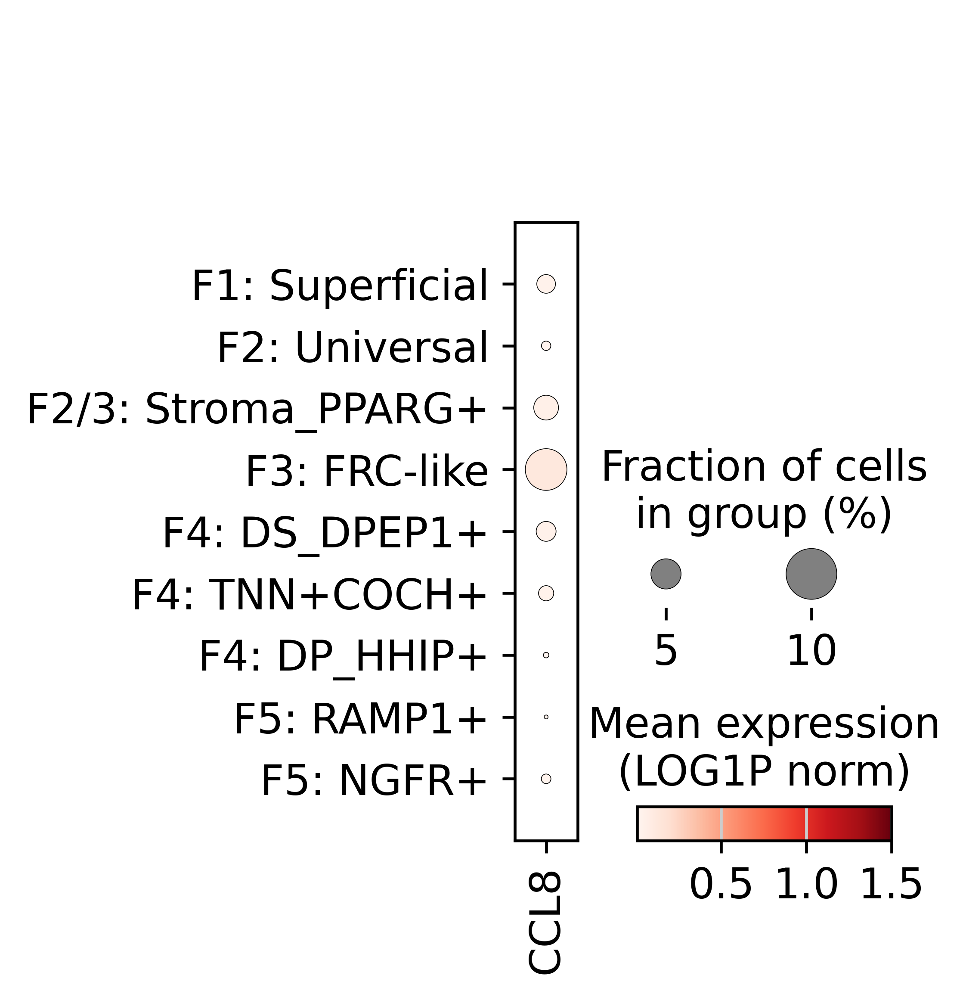

In [6]:
sc.pl.dotplot(
    adata_core,
    ["CCL8"],
    groupby="corefb_names2",
    vmax=1.5, #standard_scale="var",
    colorbar_title='Mean expression\n(LOG1P norm)', 
    dendrogram=False, #dot_max=1,
    
) 

In [4]:
adata_core.obs.corefb_names.value_counts()

corefb_names
F2: Universal               60120
F2/3:\nStroma_PPARG+        29376
F1: Superficial             27427
F4: DS_DPEP1+               19969
F3: FRC-like                19884
F4: TNN+COCH+                3604
F5: Schwann-like\nNGFR+      2769
F5: Schwann-like\nRAMP1+     1535
F4: DP_HHIP+                  965
Name: count, dtype: int64

/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


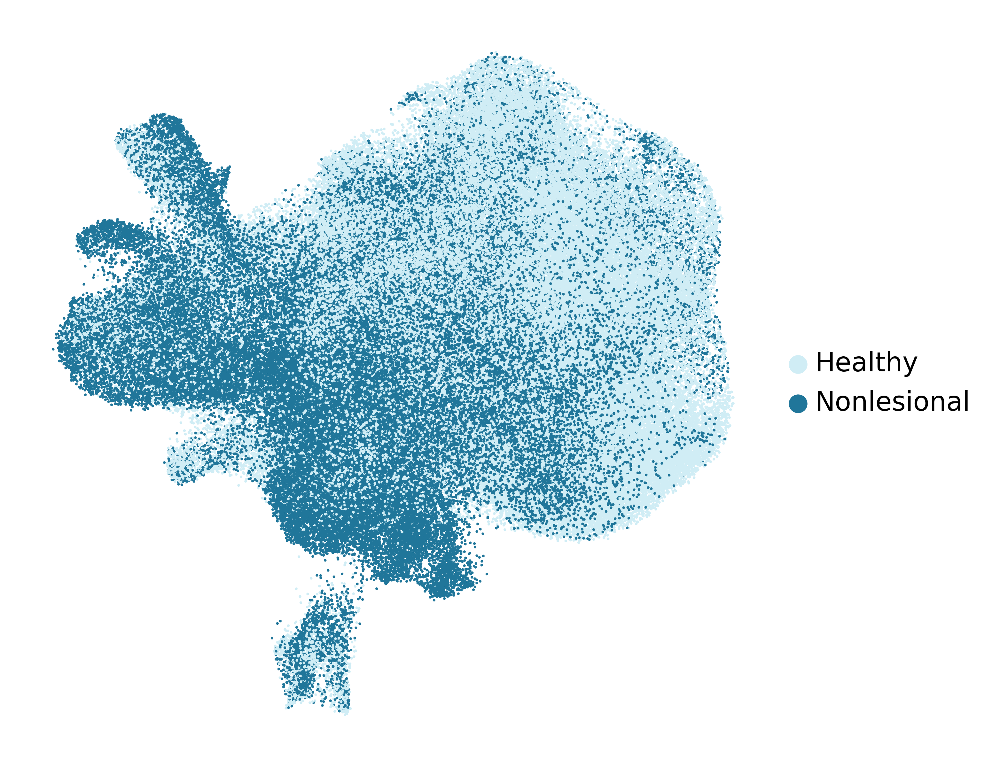

In [5]:

sc.settings.set_figure_params(dpi=300, facecolor="white", frameon=False, figsize=(5, 5))
sc.pl.umap(adata_core, 
           color=["Site_status2"],
           s=4,
           legend_fontsize=10, title='',
          save="fig1_healthy_nonlesional.pdf"
          )
sc.settings.set_figure_params(dpi=600, facecolor="white", frameon=False, figsize=(12,12))


In [8]:
sc.settings.set_figure_params(dpi=900, facecolor="white", frameon=False, figsize=(8, 8))

sc.pl.umap(
        adata_core,
        color=["corefb_names"],
        ncols=1, s=10,
    legend_loc="on data", legend_fontoutline=2, 
           legend_fontweight="normal", legend_fontsize=12, title='',
        frameon=False,
     save="_fig1umap900dpi.pdf"
    
    )
sc.settings.set_figure_params(dpi=300, facecolor="white", frameon=False, figsize=(4, 4))


/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


In [ ]:
sc.settings.set_figure_params(dpi=900, facecolor="white", frameon=False, figsize=(8, 8))

sc.pl.umap(
        adata_core,
        color=["corefb_names"],
        ncols=1, s=10,
    legend_loc=None, legend_fontoutline=2, 
           legend_fontweight="normal", legend_fontsize=12, title='',
        frameon=False,
     save="_fig1umap900dpi_nolabels.pdf"
    
    )
sc.settings.set_figure_params(dpi=300, facecolor="white", frameon=False, figsize=(4, 4))

 

/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


In [ ]:
adata_core_healthy=adata_core[adata_core.obs["Patient_status"]=="Healthy"]
reynolds_short_final = {       
    "F1":[   "APCDD1",   "COL18A1",  "COL23A1",   "COL13A1",  "COMP",  
                                          "NKD2","RSPO1",  "AXIN2" , "WIF1",'SFRP2',
                                          #"HSPB3", 
                                   ],
    
                                    
                   
    "F2: Universal": ['CD34',
  'PI16',    'DPP4', 'MFAP5', 'PCOLCE2' , 'CTHRC1',   'SLPI',#  "TSPAN8",#'MATN4',
              #"CD24",  
           "CD70", "LGR5",#"KLF4"
              ],
      'F2/3: Bridge': ['CXCL12', 'APOE', 'EFEMP1', #'GGT5', 
                                    "APOC1", "C7", "PLA2G2A", 'PPARG', #"CD36",
                                          #'IL1RL1', 'MARCH3', 'PCSK1', 
                                          
                                          
                                          # "FMO1", 
                                          
                                   # "PPARG", "TNFSF14"
                           "MYOC", "GDF10", # "LINC-PINT", 
                             # "POU3F3", 
                                  # "TNNT3", 
                    ],
 'F3': ['CCL19',"CD74" ,  'CH25H',  "TNFSF13B",  'IL33', "IRF8" ,#"COX4I2", 
       # "IL7",
        "IL15",
        "VCAM1", "HLA-DRA", "HLA-DRB1",# "CCL11","CCL7", "CCL2",
        
        #"ICAM1", 
        #'CX3CL1', 'ACHE', 'CCL8', 
 
           ], 
      

                           #     "EXTRA_F1": [   'COL23A1', 'CLEC2A', 'AXIN2', 'TNFRSF19', 'NTM', 'PLCB4', 'MYO10', 'RSPO1', 'COL6A5', 'AHRR', 'ESRRG', 'FREM1', 'UNC13C',
                            #       ],
               #   "F*": ['PLIN2', 'CEMIP' , 'ISG20', 'MMP1'], 
#"Palmoplantar": ["CRTAC1",# "HOXA13", "CILP2", #"F5",
#                 "SCX", "SOX5",  ], #"CDH13", "HPSE2", "CROCC", "CRTAC1", "CRLF1", "SCX", "LRFN5",

                   
                    "F4": ["ASPN"],          
 'F4: DS_DPEP1+': ['COL11A1','MEF2C', 
  'DPEP1',
  "MYL4", 
  #'PPP1R14A',
 # 'POSTN',
],
 'F4: TNN+COCH+': [
     #'PTGDS',
  #'OGN',
  'TNN',
  'COCH',
  'CRABP1',
  'COL24A1',"RSPO4","SLITRK6",# "CCK", 
     'NRG3', 'MKX', 'TNMD', # 'SCX'
          ],
    "F4: DP_HHIP+": ["CORIN", 
        #"INHBA", 
         "BMP7", "WNT5A", 'LEF1',
        #"SOX18", #"BAMBI", 
        "HHIP", #"RSPO2", 
        "RSPO3", "INHBA",#"ALPL",
      #  "DIO2", 
        "PTCH1", #"COL23A1", #'SOX2', 
       # 'PI15', "S100B",
           ],
        "F5": [  "SCN7A" ,"FMO2",   "FGFBP2","OLFML2A", #"TAC1" 
              ],
         
                      "F5+: RAMP1": ["RAMP1", "RELN", 'PLEKHA6',  "IGFBP2", 'SFRP1', #"COL26A1", #"TAC1"
                                   ], #"CPE", "PTN", "IGF1", 

 'F5: NGFR+': [  'EBF2', "NGFR",  'SFRP4',# "TENM2", #"TM4SF1", "ANGPTL7",  
               "ITGA6", "CDH19",  "CLDN1", #"FOXS1", #"SOX17",
                 #"CAVIN2", "SFRP5", #"TNNC1"
                
                     ],
 
}
sc.settings.set_figure_params(dpi=300, facecolor="white", frameon=False, figsize=(13,13))



sc.pl.dotplot(
    adata_core_healthy,
    reynolds_short_final,
    groupby="corefb_names2",
    vmax=1.1,
    dendrogram=False,
      colorbar_title="Mean expression\n(log1p norm)",
    save="fig1c_dotplot.pdf"
) 
 
 


sc.pl.dotplot(
    adata_core_healthy,
    reynolds_short_final,
    groupby="corefb_names2",
    standard_scale="var",
    dendrogram=False,
      colorbar_title="Mean expression\n(variance scaled)"
) 
import pickle
file_path = '/nfs/team298/ls34/fb_dict.pkl'

# Open the file in write-binary mode and pickle the dictionary
with open(file_path, 'wb') as file:
    pickle.dump(reynolds_short_final, file)

print(f"Dictionary successfully SAVED to {file_path}")
     